https://www.kaggle.com/datasets/jacksondivakarr/phone-classification-dataset  
https://www.kaggle.com/code/xkshitijx/using-randomforest-naivebayes/notebook  


ML Life cycle  
https://www.youtube.com/watch?v=xhB-dmKmzRk&ab_channel=KrishNaik  
https://github.com/krishnaik06/Advanced-House-Price-Prediction-/blob/master/Exploratory%20Data%20Analysis%20Part%201.ipynb  
https://neptune.ai/blog/life-cycle-of-a-machine-learning-project  
https://www.datacamp.com/blog/machine-learning-lifecycle-explained  
https://docs.aws.amazon.com/wellarchitected/latest/machine-learning-lens/well-architected-machine-learning-lifecycle.html  

In [84]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.utils import to_categorical   # Utilizado cuando Y tiene varias valores para una categoria:
""" Si y es un vector R^1 y tiene f valores para la categoria entonces to_categorical transforma el vector y en un vector en R^f."""

from sklearn.model_selection import  GridSearchCV, cross_val_score, KFold

import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense , Dropout
from keras import Sequential

import keras_tuner as kt
from kerastuner.tuners import RandomSearch

import pickle
import gdown
import warnings
warnings.filterwarnings('ignore')

In [85]:
# Directorio 
!mkdir "Datos"
!mkdir "Resultados"

Ya existe el subdirectorio o el archivo Datos.
Ya existe el subdirectorio o el archivo Resultados.


<span style="color:purple">Opción para descargar los modelos entrenados y sus resultados inmediatamente.</span>    

In [87]:
if False:
#if True:    
    # dict_modelos_ml.pkl: Variable que cotiene un diccionario con los modelos entrenados (Sin filtrar datos correlacionados)
    drive_url= "https://drive.google.com/file/d/1dnYdilGkFPtR7YVJg6LoO7q2CE5d_fNN/view?usp=drive_link"
    output_name = "./Resultados/dict_modelos_ml"

    # dict_modelos_ml_correl.pkl: Variable que cotiene un diccionario con los modelos entrenados (Filtrando datos correlacionados)
    drive_url= "https://drive.google.com/file/d/12lyhPfKo1fztCZejPatDIwFPGwKTe6rs/view?usp=drive_link"
    output_name = "./Resultados/dict_modelos_ml_correl"

    # resultado_Modelos: Sin filtrar datos correlacionados
    drive_url= "https://drive.google.com/file/d/1uSpKkuA1pegQlAjl2J6YWMvIsnOA7TyF/view?usp=drive_link"
    output_name = "./Resultados/resultado_Modelos.csv"

    # resultado_Modelos_Corr: Filtrando datos correlacionados
    drive_url= "https://drive.google.com/file/d/1ZaPnJZjDSJlZfNoFVWjV5LeDw884aiUW/view?usp=drive_link"
    output_name = "./Resultados/resultado_Modelos_Corr.csv"

    output_name = "./Resultados/train_celulares.csv"
    Descargar_archivo_from_drive(drive_url,output_name)

In [131]:
def Descargar_archivo_from_drive(drive_url,output_file_name):
    
    file_id = drive_url.split("/")[-2]
    download_url = f"https://drive.google.com/uc?id={file_id}"
    gdown.download(download_url, output_file_name, quiet=False)

drive_url = 'https://drive.google.com/file/d/1874uWZiApplbxuYD0nOxr_m8B9qJ_Lfc/view?usp=sharing'
output_name = "./Datos/train_celulares.csv"
Descargar_archivo_from_drive(drive_url,output_name)

data = pd.read_csv(output_name)
data.head(2)
filtrando_correlacionados=False
#filtrando_correlacionados=True

Downloading...
From: https://drive.google.com/uc?id=1874uWZiApplbxuYD0nOxr_m8B9qJ_Lfc
To: c:\Users\Nach\Desktop\ProyectosML\Problemas de Clasificacion\Mobile Phone Classification and Price Prediction Dataset\Datos\train_celulares.csv
100%|██████████| 122k/122k [00:00<00:00, 964kB/s]


The 6 steps in a standard machine learning life cycle:
- Data analysis
- feacture engineering
- Feacture selection
- Model building 
- Model Deployment
- Monitoring and Maintenance

# Data analysis.

In Data Analysis We will Analyze To Find out the below stuff
- Missing Values
- All The Numerical Variables
- Distribution of the Numerical Variables
- Categorical Variables
- Cardinality of Categorical Variables
- Outliers
- Relationship between independent and dependent feature

### Missing Values

In [132]:
print(data.isna().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


### All The Numerical Variables

In [133]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [134]:
lista=["blue","dual_sim","four_g","three_g","touch_screen","wifi","price_range"]

for columna in lista:
    data[columna] = data[columna].astype('category')    
data.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   battery_power  2000 non-null   int64   
 1   blue           2000 non-null   category
 2   clock_speed    2000 non-null   float64 
 3   dual_sim       2000 non-null   category
 4   fc             2000 non-null   int64   
 5   four_g         2000 non-null   category
 6   int_memory     2000 non-null   int64   
 7   m_dep          2000 non-null   float64 
 8   mobile_wt      2000 non-null   int64   
 9   n_cores        2000 non-null   int64   
 10  pc             2000 non-null   int64   
 11  px_height      2000 non-null   int64   
 12  px_width       2000 non-null   int64   
 13  ram            2000 non-null   int64   
 14  sc_h           2000 non-null   int64   
 15  sc_w           2000 non-null   int64   
 16  talk_time      2000 non-null   int64   
 17  three_g        2000 non-null   ca

In [135]:
columnas=list(data.columns)
for col in columnas:
    print(col,"--->",
        data[col].dtypes  ,"--->",
        len(data[col].unique()))

battery_power ---> int64 ---> 1094
blue ---> category ---> 2
clock_speed ---> float64 ---> 26
dual_sim ---> category ---> 2
fc ---> int64 ---> 20
four_g ---> category ---> 2
int_memory ---> int64 ---> 63
m_dep ---> float64 ---> 10
mobile_wt ---> int64 ---> 121
n_cores ---> int64 ---> 8
pc ---> int64 ---> 21
px_height ---> int64 ---> 1137
px_width ---> int64 ---> 1109
ram ---> int64 ---> 1562
sc_h ---> int64 ---> 15
sc_w ---> int64 ---> 19
talk_time ---> int64 ---> 19
three_g ---> category ---> 2
touch_screen ---> category ---> 2
wifi ---> category ---> 2
price_range ---> category ---> 4


### Distribution variables continuas

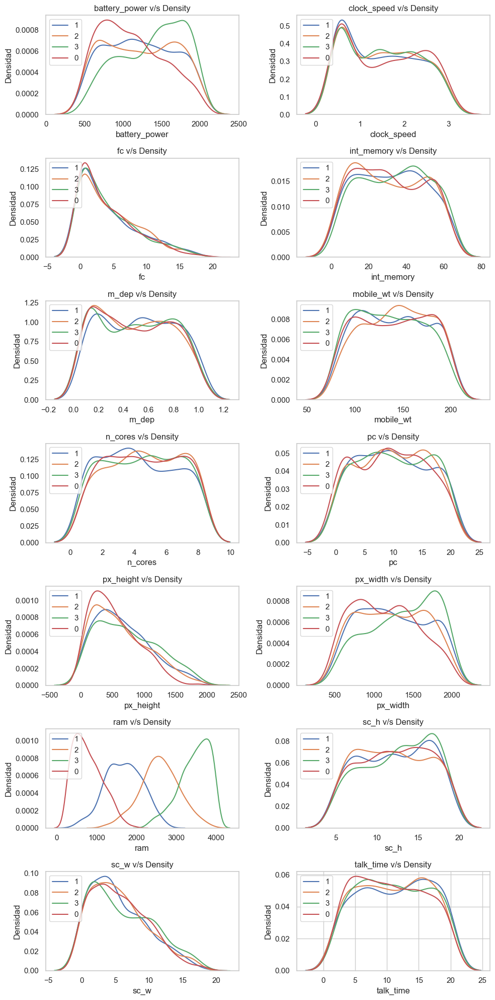

In [136]:
#if False:
if True:    
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns

    label_prices=data["price_range"].unique()


    cant_rows=len(columnas_numericas) //2
    residuo=len(columnas_numericas) % 2
    if residuo == 1:
        cant_rows=cant_rows + 1 


    fig, axes = plt.subplots(nrows=cant_rows, ncols=2, figsize=(10, 20))

    for j in range(len(columnas_numericas)):
        feature=columnas_numericas[j]
        num_row=j // 2
        num_col=j % 2
        
        for etiq in label_prices:
            sns.kdeplot(x=feature, data=data[data["price_range"]==etiq], ax=axes[num_row, num_col], label=etiq)    
        axes[num_row, num_col].grid()
        axes[num_row, num_col].set_title(feature+' v/s Density' )
        axes[num_row, num_col].set_xlabel(feature)
        axes[num_row, num_col].set_ylabel('Densidad')
        axes[num_row, num_col].legend(loc='upper left') 
    plt.grid()
    plt.tight_layout()
    plt.show()
        


### Proporción de datos de variables numéricas en los datos

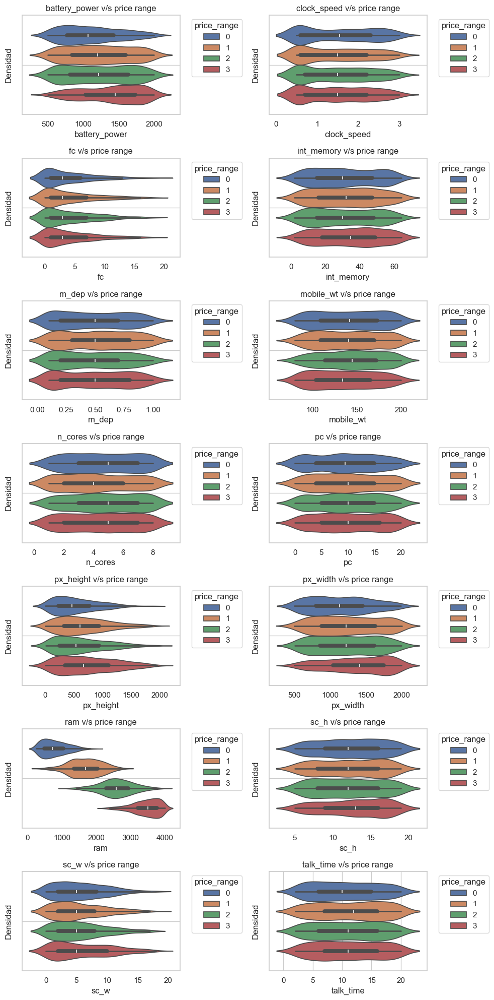

In [137]:
#if False:
if True:        
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns

    label_prices=data["price_range"].unique()


    cant_rows=len(columnas_numericas) //2
    residuo=len(columnas_numericas) % 2
    if residuo == 1:
        cant_rows=cant_rows + 1 

    fig, axes = plt.subplots(nrows=cant_rows, ncols=2, figsize=(10, 20))

    for j in range(len(columnas_numericas)):
        feature=columnas_numericas[j]
        num_row=j // 2
        num_col=j % 2
        
        sns.violinplot(x=feature, hue="price_range",data=data, ax=axes[num_row, num_col])
        
        axes[num_row, num_col].grid()
        axes[num_row, num_col].set_title(feature+' v/s price range' )
        axes[num_row, num_col].set_xlabel(feature)
        axes[num_row, num_col].set_ylabel('Densidad')
        axes[num_row, num_col].legend(title="price_range", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.grid()
    plt.tight_layout()
    plt.show()
        


<Figure size 400x300 with 0 Axes>

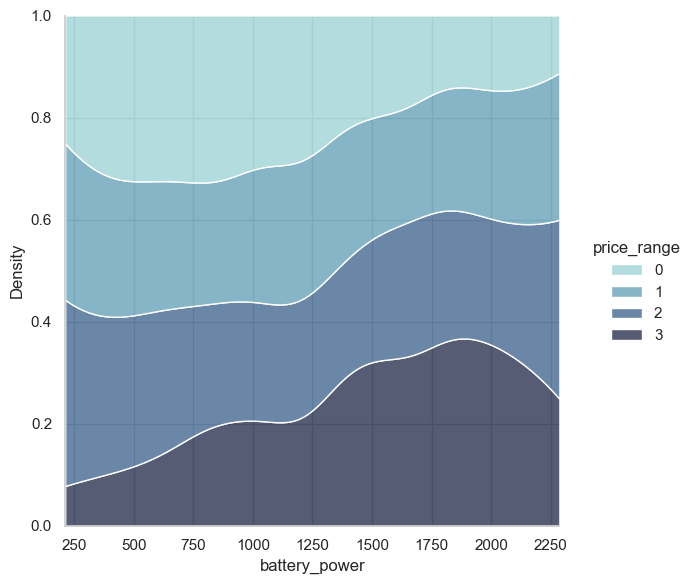

<Figure size 400x300 with 0 Axes>

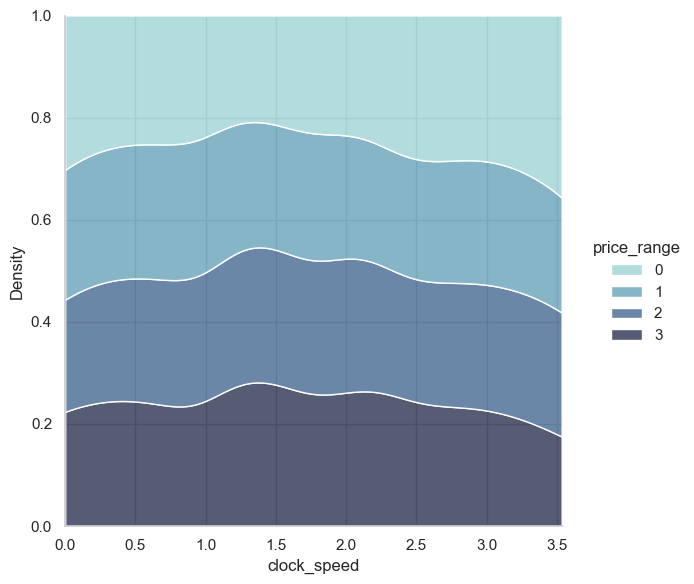

<Figure size 400x300 with 0 Axes>

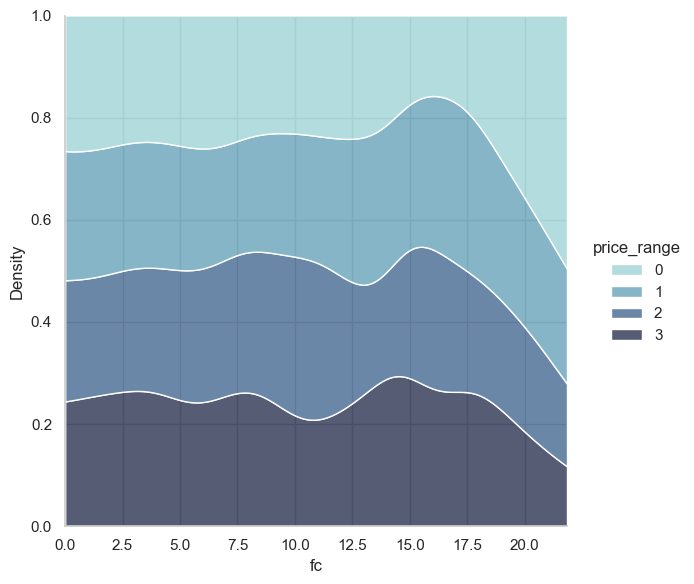

<Figure size 400x300 with 0 Axes>

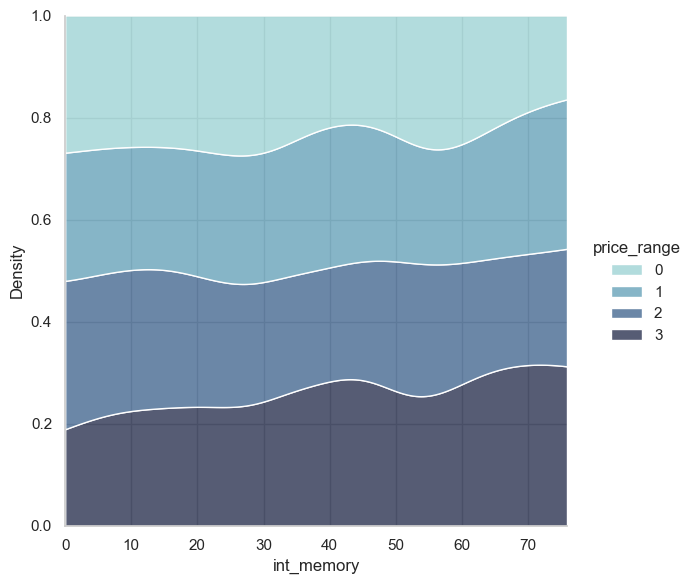

<Figure size 400x300 with 0 Axes>

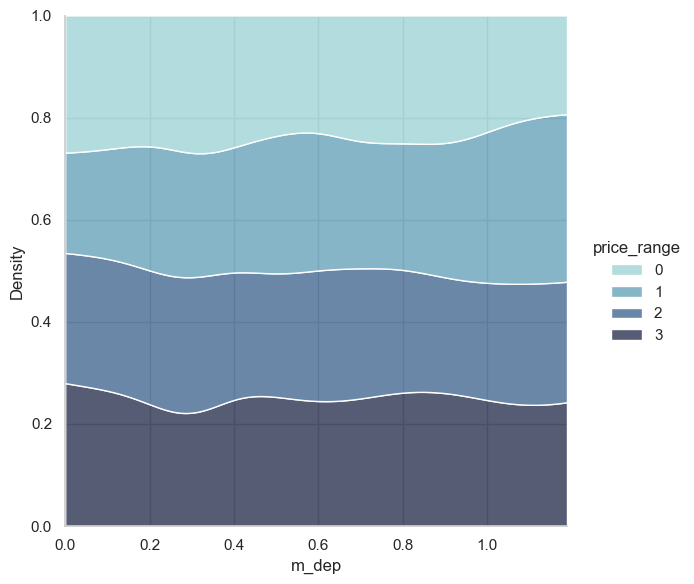

<Figure size 400x300 with 0 Axes>

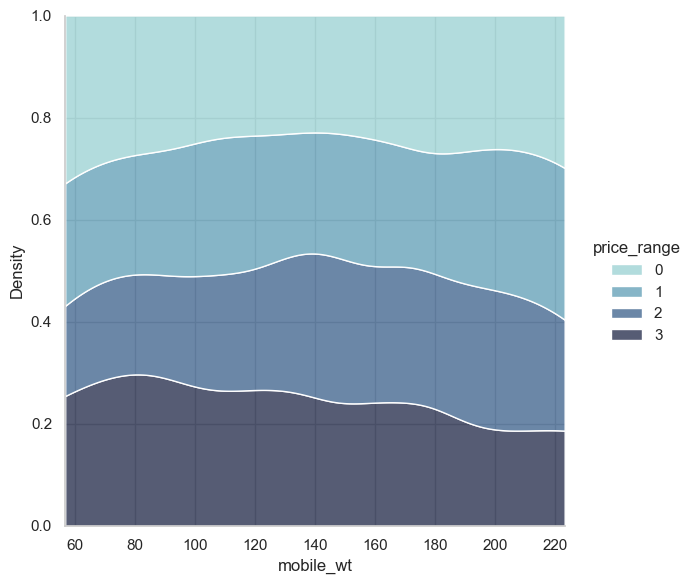

<Figure size 400x300 with 0 Axes>

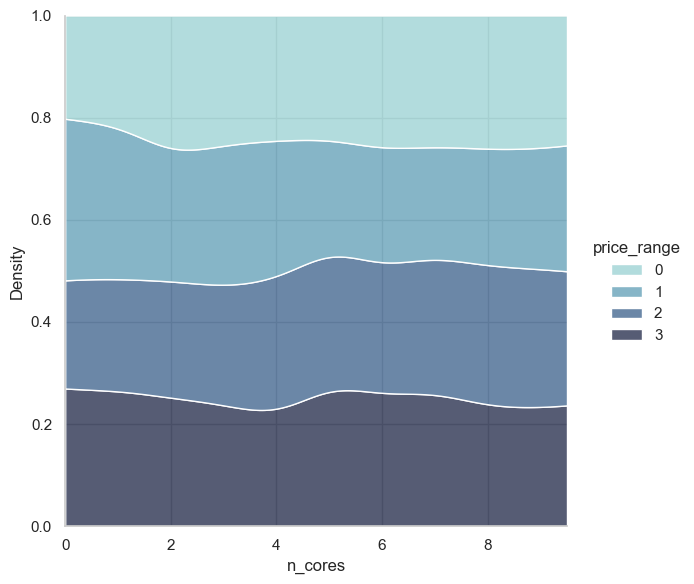

<Figure size 400x300 with 0 Axes>

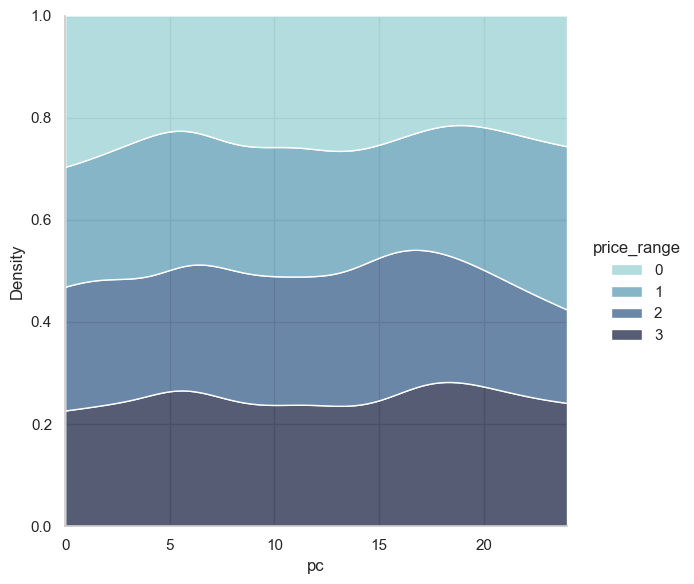

<Figure size 400x300 with 0 Axes>

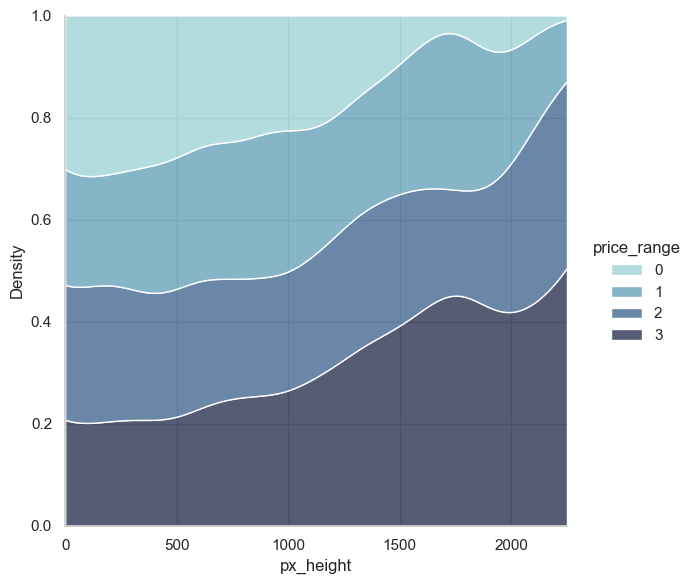

<Figure size 400x300 with 0 Axes>

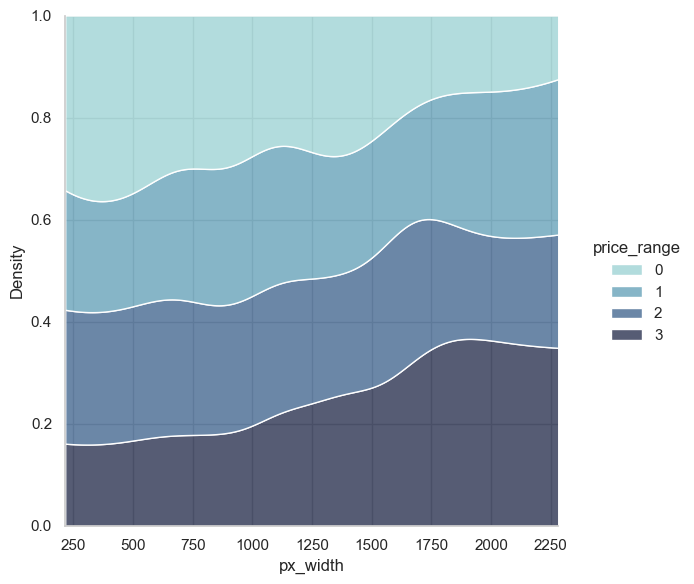

<Figure size 400x300 with 0 Axes>

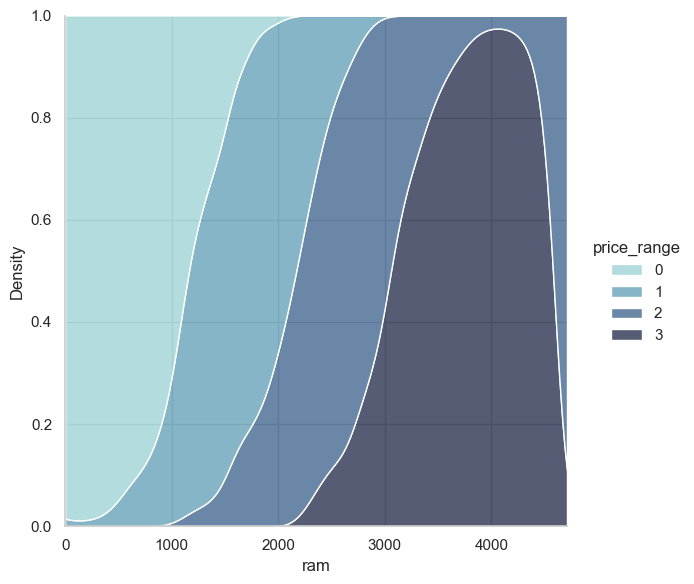

<Figure size 400x300 with 0 Axes>

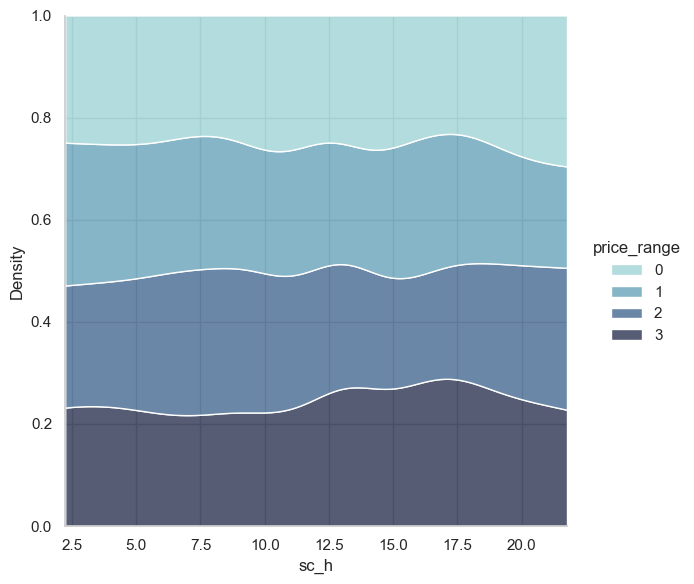

<Figure size 400x300 with 0 Axes>

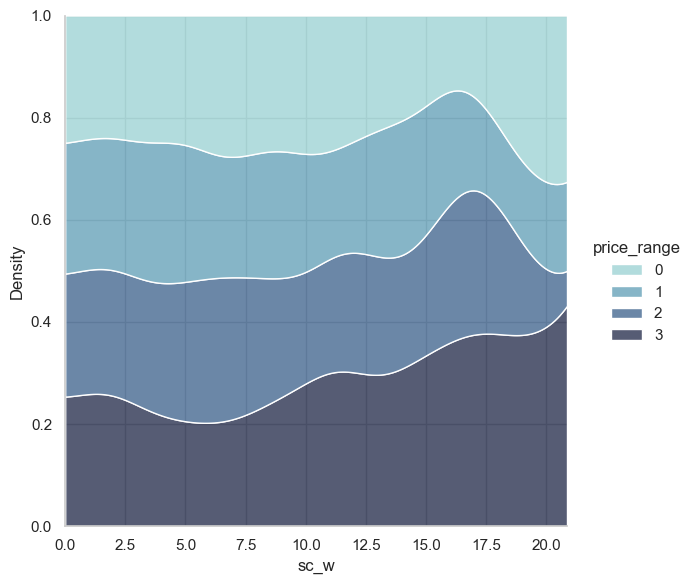

<Figure size 400x300 with 0 Axes>

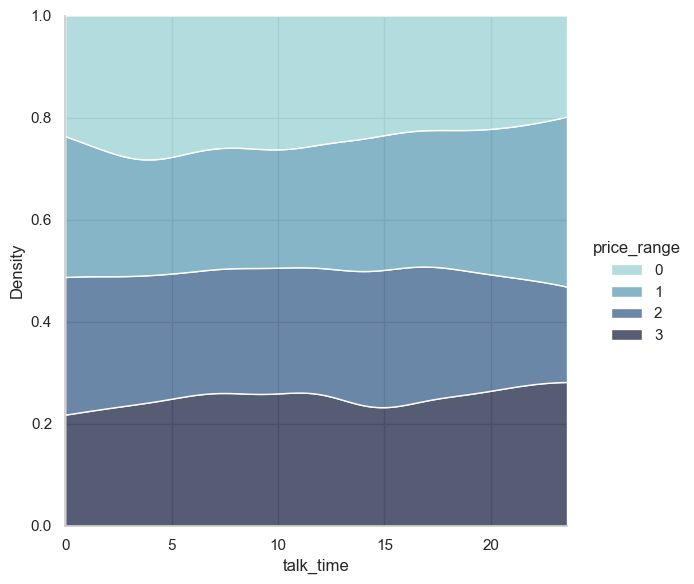

In [138]:
#if False:
if True:        
    sns.set_theme(style="whitegrid")

    columnas_numericas=list(data.select_dtypes(exclude=["category"]).columns)
    columnas_category=list(data.select_dtypes(include=["category"]).columns)

    label_prices=data["price_range"].unique()

    l_col=columnas_numericas[0:]
    for col in l_col:
        fig = plt.figure(figsize=(4, 3))
        
        sns.displot( data, x=col, hue="price_range",kind="kde", multiple="fill" ,height=6, clip=(0, None), palette="ch:rot=-.25,hue=1,light=.75")    
        plt.show()


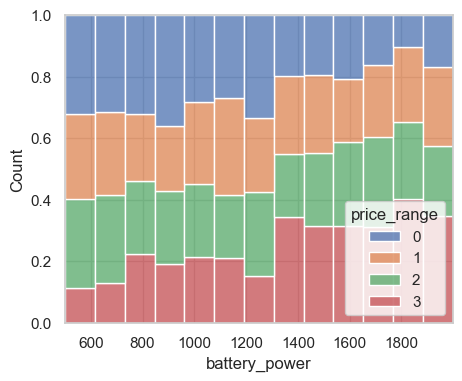

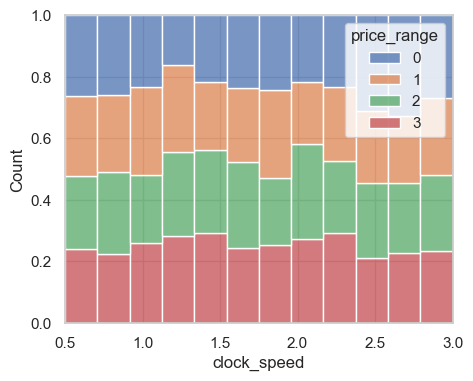

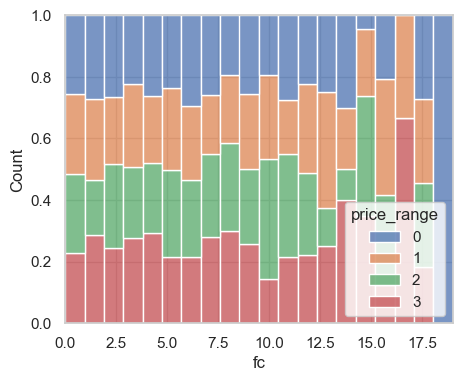

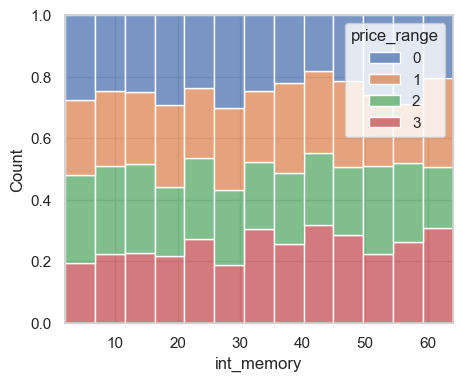

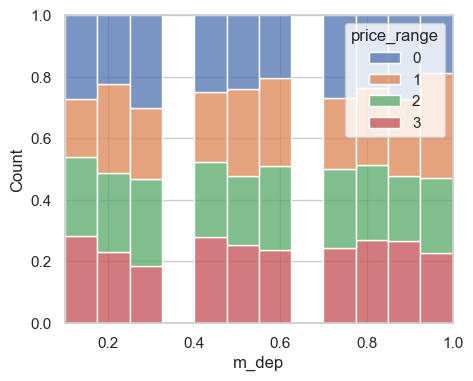

...

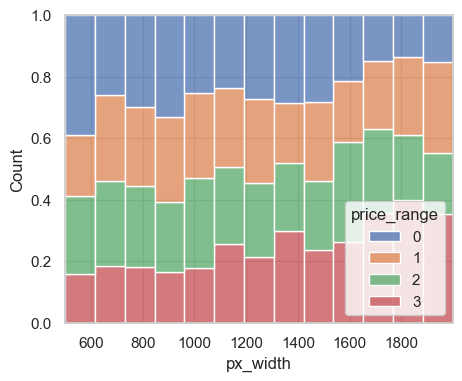

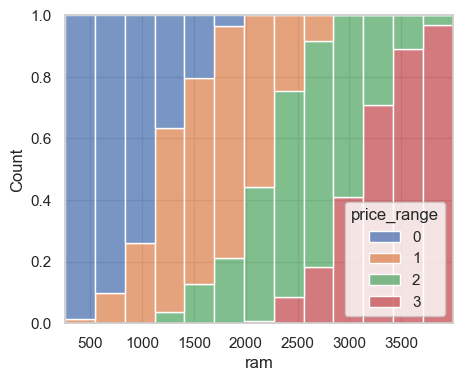

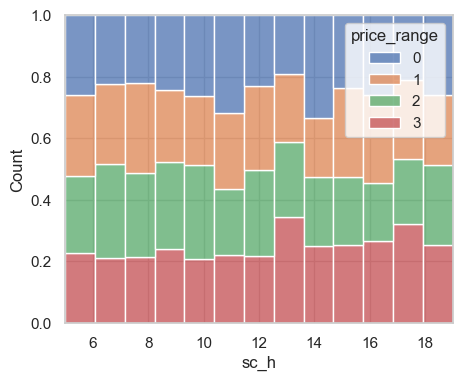

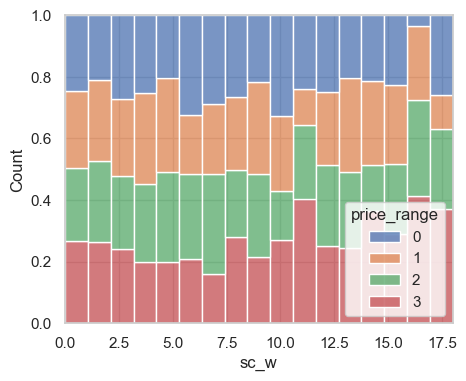

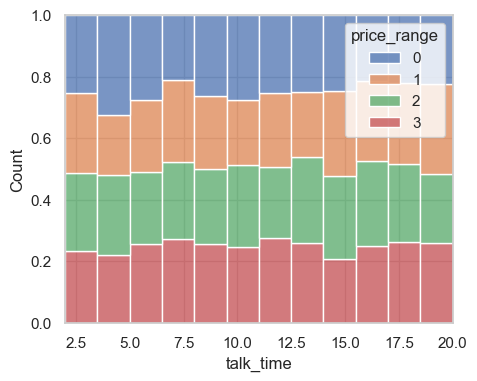

In [139]:
#if False:
if True:        
    columnas_numericas=list(data.select_dtypes(exclude=["category"]).columns)
    columnas_category=list(data.select_dtypes(include=["category"]).columns)

    label_prices=data["price_range"].unique()

    l_col=columnas_numericas[0:]
    for col in l_col:
        fig = plt.figure(figsize=(5, 4))
        sns.histplot(data, x=col, hue="price_range", multiple="fill")    
        plt.show()
        

### Cardinalidad variable dependiente


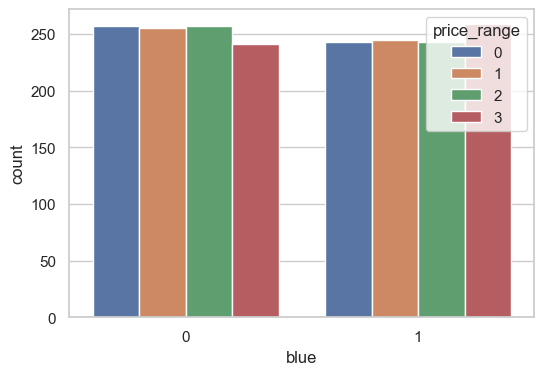

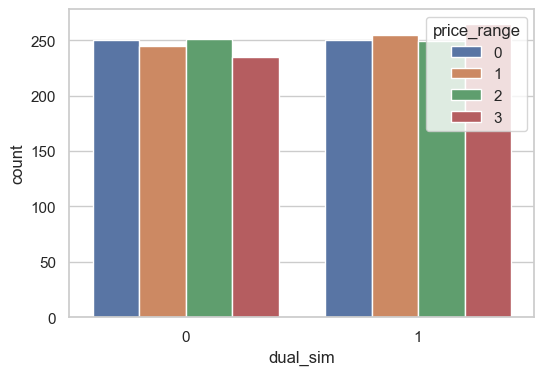

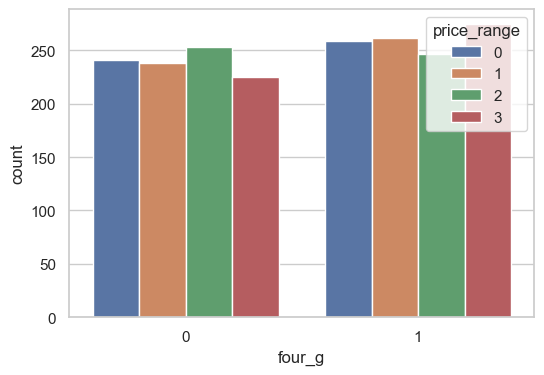

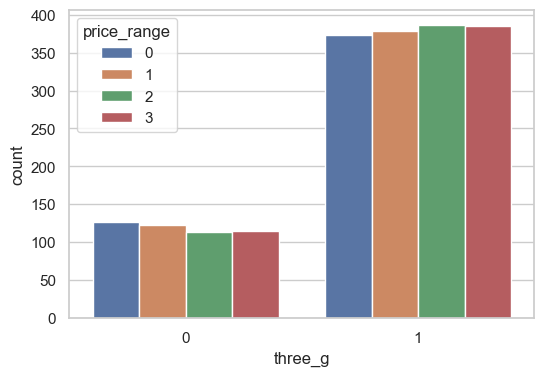

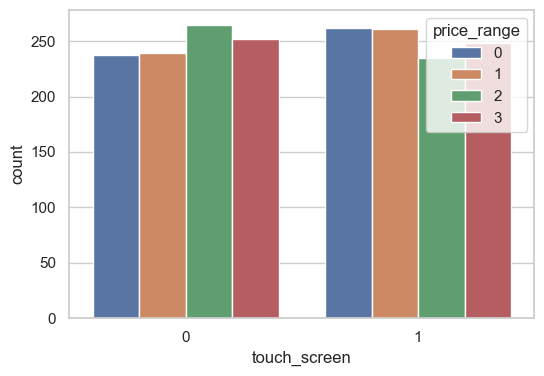

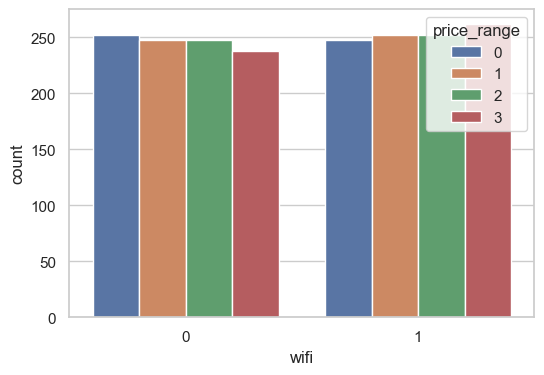

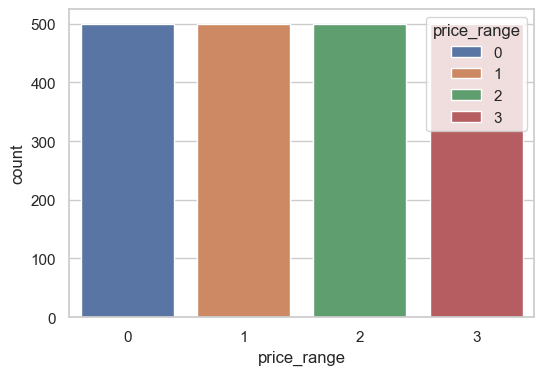

In [140]:
#if False:
if True:        
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns
    for col in columnas_category:
        fig = plt.figure(figsize=(6, 4))
        sns.countplot(data=data, x=col, hue="price_range")

In [141]:
value_counts_result = data.price_range.value_counts()
value_counts_result

price_range
0    500
1    500
2    500
3    500
Name: count, dtype: int64

### Outliers

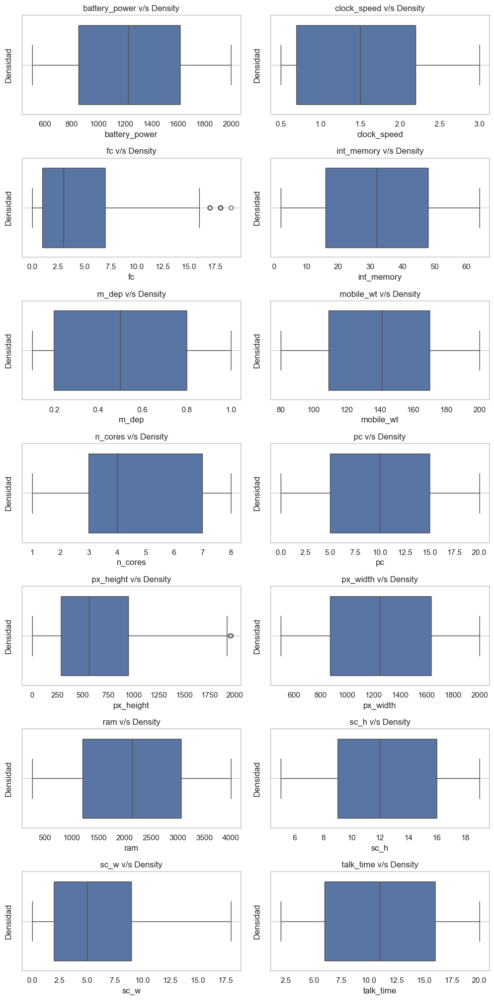

In [142]:
if True:
#if False:    
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns

    label_prices=data["price_range"].unique()


    cant_rows=len(columnas_numericas) //2
    residuo=len(columnas_numericas) % 2
    if residuo == 1:
        cant_rows=cant_rows + 1 


    fig, axes = plt.subplots(nrows=cant_rows, ncols=2, figsize=(10, 20))

    for j in range(len(columnas_numericas)):
        feature=columnas_numericas[j]
        num_row=j // 2
        num_col=j % 2
        
        sns.boxplot(x=feature, data=data, ax=axes[num_row, num_col])
        axes[num_row, num_col].grid()
        axes[num_row, num_col].set_title(feature+' v/s Density' )
        axes[num_row, num_col].set_xlabel(feature)
        axes[num_row, num_col].set_ylabel('Densidad')

    plt.tight_layout()
    plt.show()
        


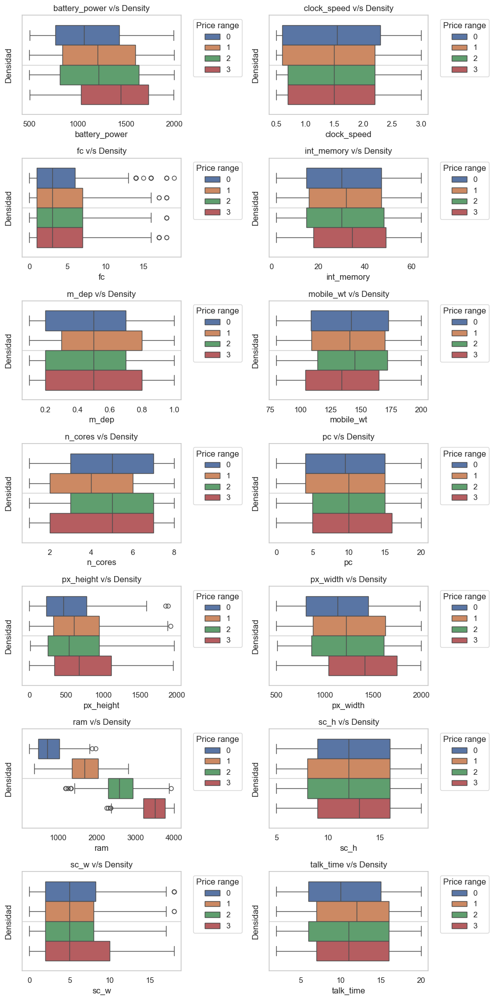

In [143]:
if True:
#if False:    
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns

    label_prices=data["price_range"].unique()


    cant_rows=len(columnas_numericas) //2
    residuo=len(columnas_numericas) % 2
    if residuo == 1:
        cant_rows=cant_rows + 1 


    fig, axes = plt.subplots(nrows=cant_rows, ncols=2, figsize=(10, 20))

    for j in range(len(columnas_numericas)):
        feature=columnas_numericas[j]
        num_row=j // 2
        num_col=j % 2
        
        sns.boxplot(x=feature, data=data,hue="price_range", ax=axes[num_row, num_col])
        axes[num_row, num_col].grid()
        axes[num_row, num_col].set_title(feature+' v/s Density' )
        axes[num_row, num_col].set_xlabel(feature)
        axes[num_row, num_col].set_ylabel('Densidad')
        axes[num_row, num_col].legend(title="Price range", bbox_to_anchor=(1.05, 1), loc='upper left')
        #axes[num_row, num_col].legend(loc='upper left') 

    plt.tight_layout()
    plt.show()
        


### Quitar outliers

In [144]:
def eliminar_outliers(df ,columna, factor=1):
    
    Q1 = df[columna].quantile(0.25)
    Q3 = df[columna].quantile(0.75)
    IQR = Q3 - Q1

    # Definir el rango para identificar outliers
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    
    df_filtrado = df[(df[columna] >= lower_bound) & (df[columna] <= upper_bound)]
    return df_filtrado.reset_index(drop=True)

data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [145]:

list_cols_outiliers=["fc","int_memory","ram","px_height"]
imagen_price_range=list(data["price_range"].value_counts().index)

factor=1.4 # factor que determina que tan estricto es para eliminar outliers (más alto más estricto)

df1=data.copy()
for col in list_cols_outiliers:
    for price in imagen_price_range:
        mascara=df1["price_range"]==price
        df2=df1[mascara].reset_index(drop=True)
        data_sin_outliers = eliminar_outliers(df2, col,factor)
        dimension=data_sin_outliers.shape

        if dimension[0]!=0:
            df1=pd.concat([data_sin_outliers,df1[~mascara]]).reset_index(drop=True)
        else:
            df1=df1[~mascara].reset_index(drop=True)

# Mostrar la forma del DataFrame original y el DataFrame sin outliers
print("Forma del DataFrame original:", data.shape)
print("Forma del DataFrame sin outliers:", df1.shape)      
data=df1

Forma del DataFrame original: (2000, 21)
Forma del DataFrame sin outliers: (1920, 21)


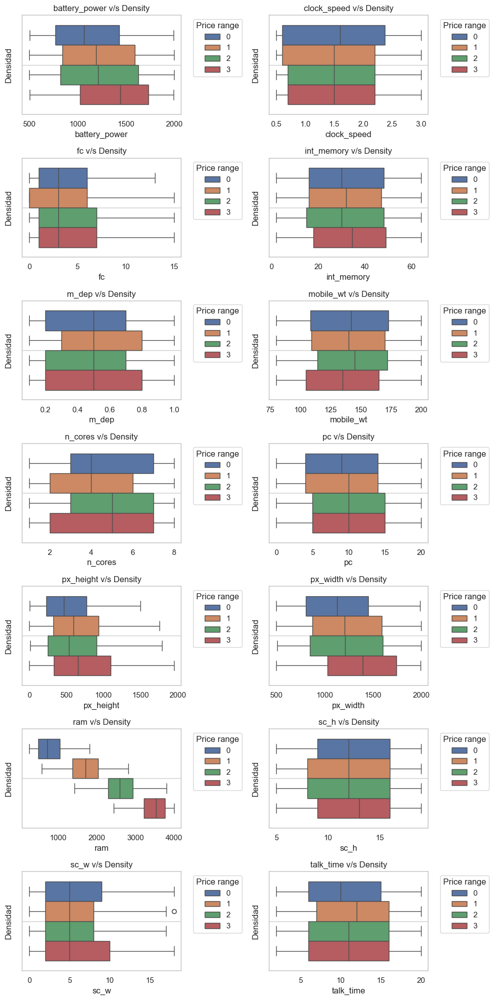

In [146]:
if True:
#if False:    
    columnas_numericas=data.select_dtypes(exclude=["category"]).columns
    columnas_category=data.select_dtypes(include=["category"]).columns

    label_prices=data["price_range"].unique()


    cant_rows=len(columnas_numericas) //2
    residuo=len(columnas_numericas) % 2
    if residuo == 1:
        cant_rows=cant_rows + 1 


    fig, axes = plt.subplots(nrows=cant_rows, ncols=2, figsize=(10, 20))

    for j in range(len(columnas_numericas)):
        feature=columnas_numericas[j]
        num_row=j // 2
        num_col=j % 2
        
        sns.boxplot(x=feature, data=df1,hue="price_range", ax=axes[num_row, num_col])
        axes[num_row, num_col].grid()
        axes[num_row, num_col].set_title(feature+' v/s Density' )
        axes[num_row, num_col].set_xlabel(feature)
        axes[num_row, num_col].set_ylabel('Densidad')
        axes[num_row, num_col].legend(title="Price range", bbox_to_anchor=(1.05, 1), loc='upper left')
        #axes[num_row, num_col].legend(loc='upper left') 

    plt.tight_layout()
    plt.show()

### Estudio multivariable

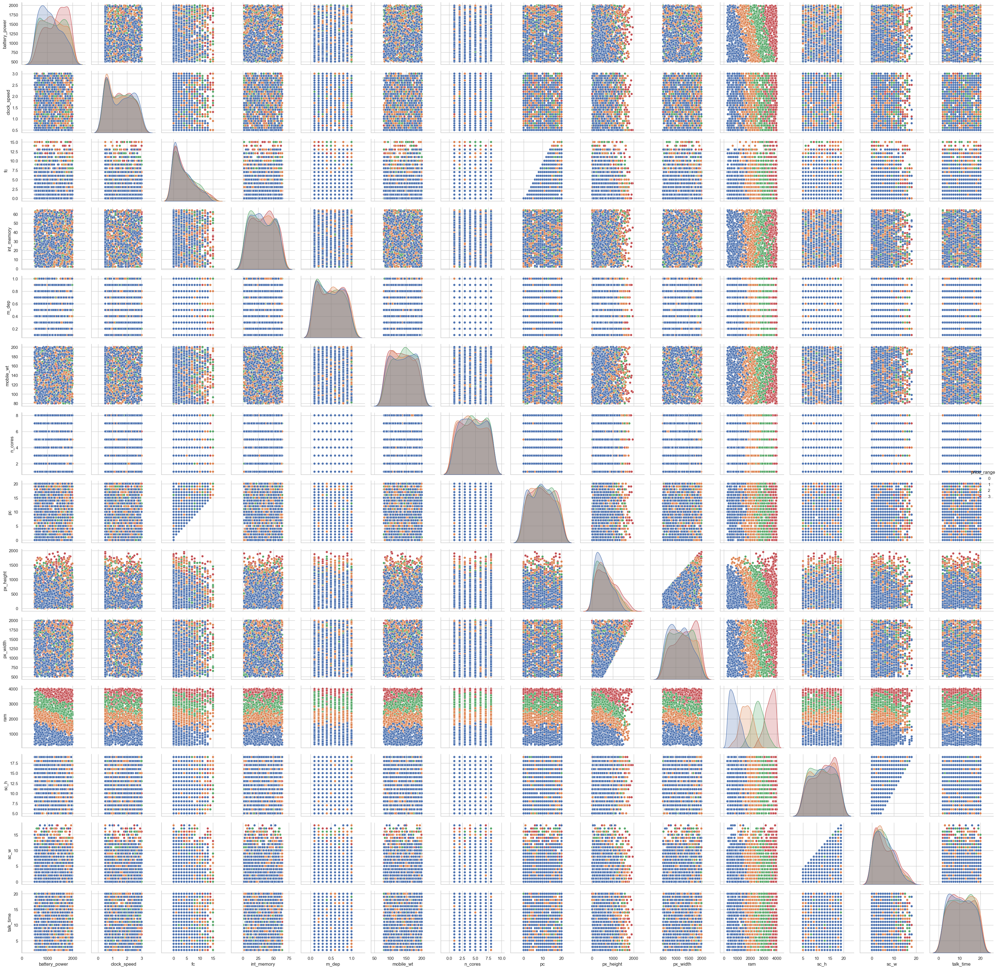

In [147]:
if True:
#if False:    
    columnas_numericas=list(data.select_dtypes(exclude=["category"]).columns)
    columnas_numericas.append("price_range")

    columnas_category=data.select_dtypes(include=["category"]).columns
    sns.pairplot( data = data[list(columnas_numericas)],hue="price_range")
    plt.tight_layout()
    plt.show()

***Correlation Matrix***

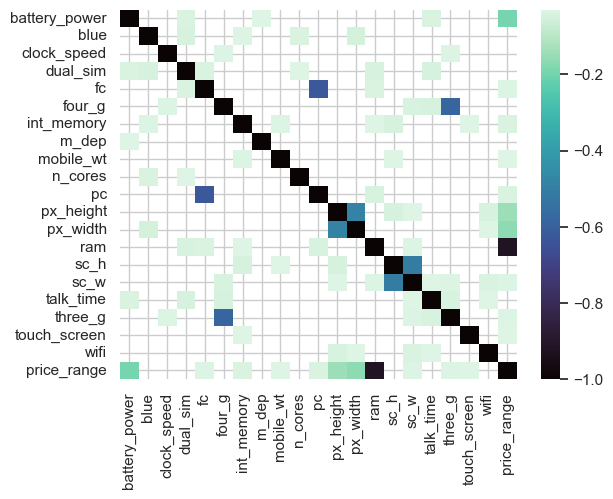

In [148]:
umbral = 0.03
corr_matrix=abs(data.corr())
boolean_matrix =np.where(corr_matrix < umbral, True, False)
                    
sns.heatmap(-corr_matrix, cmap='mako', mask=boolean_matrix)
plt.show()

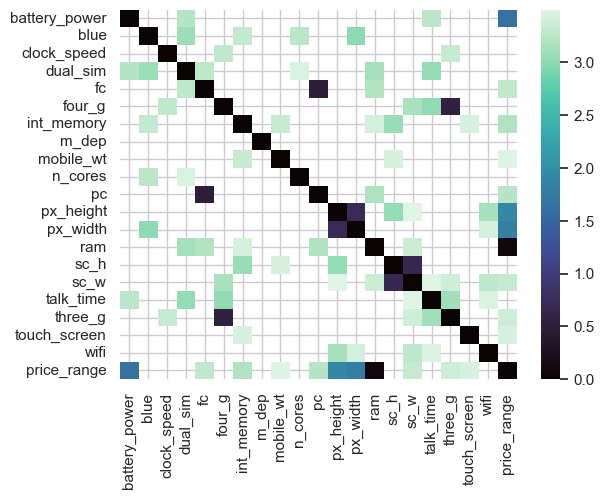

In [149]:
umbral = 3.5
corr_matrix= -np.log(abs(data.corr()))
boolean_matrix = np.where(corr_matrix < umbral, False,True)

sns.heatmap(corr_matrix, cmap='mako', mask=boolean_matrix)
plt.show()

In [150]:
if filtrando_correlacionados:
    data_correl=data

    for aff,col in zip(list(boolean_matrix[-1,:]),list(data.columns)):
        if aff==True:
            data_correl = data_correl.drop(col, axis = 1)

    umbral = 3.5
    corr_matrix= -np.log(abs(data_correl.corr()))
    boolean_matrix = np.where(corr_matrix < umbral, False,True)

    sns.heatmap(corr_matrix, cmap='mako', mask=boolean_matrix)
    plt.show()

    data=data_correl

***Splitting Training data sets***

In [151]:
scaler = MinMaxScaler(feature_range=(0, 1)).fit_transform(data)
X = pd.DataFrame(scaler, columns=data.columns)
X.describe().T.style.background_gradient(axis=0)

,count,mean,std,min,25%,50%,75%,max
battery_power,1920.000000,0.490876,0.292655,0.000000,0.234469,0.481964,0.738978,1.000000
blue,1920.000000,0.495833,0.500113,0.000000,0.000000,0.000000,1.000000,1.000000
clock_speed,1920.000000,0.408771,0.327065,0.000000,0.080000,0.400000,0.680000,1.000000
dual_sim,1920.000000,0.509375,0.500042,0.000000,0.000000,1.000000,1.000000,1.000000
fc,1920.000000,0.266910,0.262681,0.000000,0.066667,0.200000,0.466667,1.000000
four_g,1920.000000,0.519792,0.499738,0.000000,0.000000,1.000000,1.000000,1.000000
int_memory,1920.000000,0.486450,0.292589,0.000000,0.225806,0.483871,0.741935,1.000000
m_dep,1920.000000,0.446644,0.320365,0.000000,0.111111,0.444444,0.777778,1.000000
mobile_wt,1920.000000,0.502326,0.294801,0.000000,0.241667,0.508333,0.750000,1.000000
n_cores,1920.000000,0.503869,0.326511,0.000000,0.285714,0.428571,0.857143,1.000000


In [152]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

XX = data.drop(['price_range'], axis = 1)
y = data['price_range']

dato_dummies=pd.get_dummies(XX)    
scaler = MinMaxScaler(feature_range=(0, 1)).fit_transform(dato_dummies)

X = pd.DataFrame(scaler, columns=dato_dummies.columns)
X_train , X_test , Y_train , Y_test = train_test_split(X,y,test_size= 0.2 ,shuffle=True , random_state=1)


y_one_hot = pd.get_dummies(Y_train).astype(int)
y_one_hot_test = pd.get_dummies(Y_test).astype(int)

In [153]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
    
def grid_para_model_ml(model_name,Model,fold_cv,parameters,X_train,Y_train,X_test,Y_test):
    model_grid = GridSearchCV(estimator=Model, cv=fold_cv, param_grid=parameters).fit(X_train , Y_train)
    model=model_grid.best_estimator_
    
    print("\n" ,"Modelo:",model_name )
    y_pred_train=model.predict(X_test)
    print("Presición modelo (Train):",precision_score(Y_test, y_pred_train, average='micro'))
    
    y_pred_test=model.predict(X_test)
    print("Presición modelo (Test):",precision_score(Y_test, y_pred_test, average='micro'))
    
    return model

# Algoritmos ML 

In [154]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import LinearSVC
from sklearn import svm
from sklearn.neighbors import NearestCentroid
import xgboost as xgb

dict_parameter={}
#  Random Forest
parameters = {
    'n_estimators' : [50, 150, 500],
    'criterion' : ['gini', 'entropy', 'log_loss'],
    'max_features' : ['sqrt', 'log2'],
    'n_jobs':[-1]
}
dict_parameter["Ramdon Forest"]=(RandomForestClassifier(random_state=20),parameters)

#  GaussianNB
parameters = {
    'var_smoothing' : [1e-7,1e-8,1e-9,1e-10,1e-11]
}
dict_parameter["GaussianNB"]=(GaussianNB(),parameters)

# MLPClassifier
model=MLPClassifier()
parameters = {
    "activation":["identity","logistic","tanh","relu"],
    "solver":["lbfgs","sgd","adam"],
    "learning_rate":["constant","invscaling","adaptive"]
}
dict_parameter["MLPClassifier"]=(model,parameters)

# LinearSVC
model=LinearSVC()
parameters = {
    "penalty":["l1","l2"],
    "loss":["hinge","squared_hinge"],
    "C":[1e2,1e1,1e-1,1e-2],
    "max_iter":[1000],
    "intercept_scaling":[False, True],
    "multi_class":["ovr","crammer_singer"]
}
dict_parameter["LinearSVC"]=(model,parameters)

# svm.NuSVC
model=svm.NuSVC(gamma="auto")
parameters = {
    "kernel":["linear","poly","rbf","sigmoid"],
    "degree":[1,3,5,7]
}
dict_parameter["svm.NuSVC"]=(model,parameters)

# NearestCentroid
model=NearestCentroid()
parameters = { }
dict_parameter["NearestCentroid"]=(model,parameters)

# xgb.XGBClassifier
model=xgb.XGBClassifier(
    objective='binary:logistic',  # 'multi:softmax' para clasificación multiclase
    eval_metric='logloss',         # Métrica de evaluación
    use_label_encoder=False        # Desactivar la codificación automática de etiquetas
    )
parameters = {
    "kernel":["linear","poly","rbf","sigmoid"],
    "degree":[1,2,3,4,5,6,7]
}
dict_parameter["xgb.XGBClassifier"]=(model,parameters)

dict_parameter.keys()

dict_keys(['Ramdon Forest', 'GaussianNB', 'MLPClassifier', 'LinearSVC', 'svm.NuSVC', 'NearestCentroid', 'xgb.XGBClassifier'])

In [155]:
l_nombre_model=[]
l_modelo=[]
fold_cv, Imprimir=5,True

for model_name in list(dict_parameter.keys()):
    (model,parameters)=dict_parameter[model_name]
    best_model=grid_para_model_ml(model_name,model,fold_cv,parameters,X_train,Y_train,X_test,Y_test)
    l_nombre_model.append(model_name)
    l_modelo.append(best_model)


 Modelo: Ramdon Forest
Presición modelo (Train): 0.890625
Presición modelo (Test): 0.890625

 Modelo: GaussianNB
Presición modelo (Train): 0.8046875
Presición modelo (Test): 0.8046875

 Modelo: MLPClassifier
Presición modelo (Train): 0.9661458333333334
Presición modelo (Test): 0.9661458333333334

 Modelo: LinearSVC
Presición modelo (Train): 0.9583333333333334
Presición modelo (Test): 0.9583333333333334

 Modelo: svm.NuSVC
Presición modelo (Train): 0.9453125
Presición modelo (Test): 0.9453125

 Modelo: NearestCentroid
Presición modelo (Train): 0.6328125
Presición modelo (Test): 0.6328125

 Modelo: xgb.XGBClassifier
Presición modelo (Train): 0.90625
Presición modelo (Test): 0.90625


In [156]:
# Suavizar resultados de entrenamiento
def MediasMoviles(datos,ventana ):
    pseudo_datos=list(datos)
    for i in range(ventana -1):
        pseudo_datos.insert(0, 0)

    datos_suavizados = np.convolve(pseudo_datos, np.ones(ventana)/ventana, mode='valid')
    return datos_suavizados

# Graficar resultados de datos de entrenamiento
def grafica_rendimient0(accuracy,cant_pto_accuracy,val_accuracy,cant_pto_val_accuracy,plot_scatter,porc):

    soft_accuracy=MediasMoviles(accuracy,cant_pto_accuracy)
    soft_val_accuracy=MediasMoviles(val_accuracy,cant_pto_val_accuracy)

    linea1=[max(soft_val_accuracy)] *len(soft_val_accuracy)
    plt.plot( soft_accuracy, label='soft_accuracy', color='purple',linestyle='dashed')
    plt.plot(soft_val_accuracy, label='soft_val_accuracy', color="red", linestyle='dashed')
    plt.plot(linea1, label='linea validation test', color="green", linestyle='dashed')
    
    if plot_scatter:
        plt.scatter(range(1,len(accuracy)+1),accuracy,label='Accuracy',s=10,linestyle='dashed')
        plt.scatter(range(1,len(val_accuracy)+1),val_accuracy, label='Validation Accuracy',s=10,linestyle='dashed')

    plt.ylim([0.5,1.5])
    plt.grid()
    plt.legend()
    plt.xlabel("Época")
    plt.ylabel("Porcentaje")
    plt.show()
    
    
    tamanio=int(len(soft_accuracy)*porc)
    x_f=len(soft_accuracy)
    x_0=x_f-tamanio
    
    dominio=list(range(x_0,x_f))

    print("len(dominio)",len(dominio), dominio[-1])

    plt.plot(   dominio,soft_accuracy[x_0:x_f], label='soft_accuracy', color='purple',linestyle='dashed'   ,linewidth=0.8)
    plt.scatter(dominio,accuracy[x_0:x_f], label='Accuracy',s=30)
    plt.plot   (dominio,soft_val_accuracy[x_0:x_f], label='soft_val_accuracy', color='red',linestyle='dashed',linewidth=1.2)
    plt.scatter(dominio,val_accuracy[x_0:x_f], label='Validation Accuracy',s=30)
    
    plt.legend()
    plt.xlabel("Época")
    plt.ylabel("Porcentaje")
    plt.ylim([0.9,1.1])
    plt.grid()
    plt.show()


In [157]:
# from keras import activations
model = Sequential()
model.add(Dense(64,activation = 'relu',input_dim =X_train.shape[1]))
model.add(Dense(256,activation = 'relu'))
model.add(Dense(4, activation='softmax'))  # Ajusta num_etiquetas según la cantidad de clases en tus datos
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history=model.fit(X_train, y_one_hot, epochs=25, batch_size=1, validation_data = (X_test , y_one_hot_test))
accuracy,val_accuracy=list(history.history['accuracy']),list(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=15, batch_size=10, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=15, batch_size=40, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=20, batch_size=150, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=20, batch_size=150, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

l_nombre_model.append("Red neuronal (relu)")
l_modelo.append(model)


Epoch 1/25


1536/1536 [==============================] - 2s 1ms/step - loss: 0.7435 - accuracy: 0.6777 - val_loss: 0.2799 - val_accuracy: 0.9167
Epoch 2/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2966 - accuracy: 0.8776 - val_loss: 0.2978 - val_accuracy: 0.8750
Epoch 3/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2790 - accuracy: 0.8809 - val_loss: 0.2390 - val_accuracy: 0.9036
Epoch 4/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2367 - accuracy: 0.8900 - val_loss: 0.1783 - val_accuracy: 0.9219
Epoch 5/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2030 - accuracy: 0.9147 - val_loss: 0.2029 - val_accuracy: 0.9036
Epoch 6/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.1850 - accuracy: 0.9212 - val_loss: 0.3583 - val_accuracy: 0.8594
Epoch 7/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.1723 - accuracy: 0.9264 - val_loss: 0.1896 - val_accuracy: 0.9062
Epo

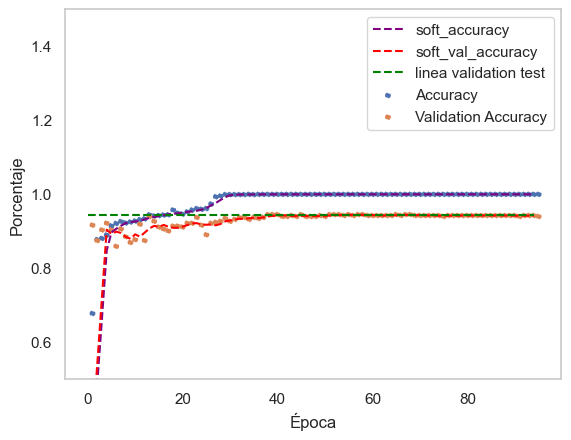

len(dominio) 85 94


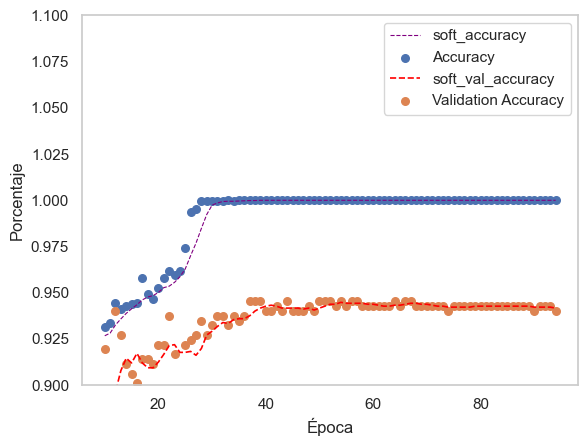

In [158]:
cant_pto_accuracy = 5
cant_pto_val_accuracy = 5
plot_scatter=True
porc=0.9
grafica_rendimient0(accuracy,cant_pto_accuracy,val_accuracy,cant_pto_val_accuracy,plot_scatter,porc)

In [159]:
# from keras import activations
model = Sequential()
model.add(Dense(64,activation = 'gelu',input_dim =X_train.shape[1]))
model.add(Dense(256,activation = 'gelu'))
model.add(Dense(4, activation='softmax'))  # Ajusta num_etiquetas según la cantidad de clases en tus datos
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history=model.fit(X_train, y_one_hot, epochs=25, batch_size=1, validation_data = (X_test , y_one_hot_test))
accuracy,val_accuracy=list(history.history['accuracy']),list(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=15, batch_size=10, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=15, batch_size=40, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])

history=model.fit(X_train, y_one_hot, epochs=20, batch_size=120, validation_data = (X_test , y_one_hot_test))
accuracy.extend(history.history['accuracy']), val_accuracy.extend(history.history['val_accuracy'])
#l_nombre_model.append("Red neuronal (gelu)")
#l_modelo.append(model)


Epoch 1/25


1536/1536 [==============================] - 2s 1ms/step - loss: 0.7160 - accuracy: 0.6660 - val_loss: 0.2837 - val_accuracy: 0.9010
Epoch 2/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.3096 - accuracy: 0.8665 - val_loss: 0.4954 - val_accuracy: 0.7656
Epoch 3/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2570 - accuracy: 0.8887 - val_loss: 0.2168 - val_accuracy: 0.9141
Epoch 4/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2206 - accuracy: 0.9030 - val_loss: 0.1825 - val_accuracy: 0.9089
Epoch 5/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.2256 - accuracy: 0.9030 - val_loss: 0.2434 - val_accuracy: 0.8958
Epoch 6/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.1939 - accuracy: 0.9206 - val_loss: 0.3147 - val_accuracy: 0.8750
Epoch 7/25
1536/1536 [==============================] - 2s 1ms/step - loss: 0.1987 - accuracy: 0.9180 - val_loss: 0.2166 - val_accuracy: 0.9062
Epo

(None, None)

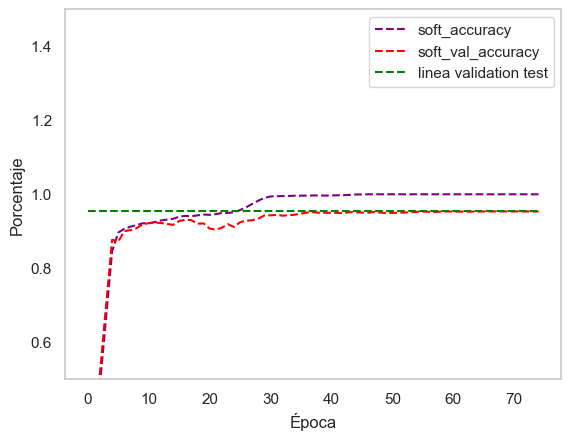

len(dominio) 22 74


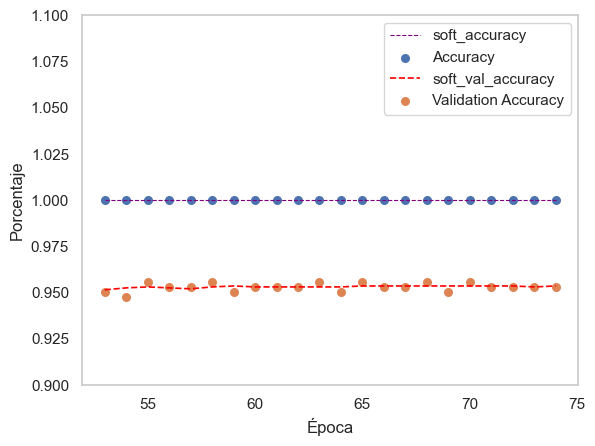

In [160]:
cant_pto_accuracy = 5
cant_pto_val_accuracy = 5
plot_scatter=False
porc=0.3
grafica_rendimient0(accuracy,cant_pto_accuracy,val_accuracy,cant_pto_val_accuracy,plot_scatter,porc)

# Resultados

In [161]:
import pickle
dict_model={x:y for x,y in zip(l_nombre_model,l_modelo)}

if not filtrando_correlacionados:
    file_name="./Resultados/dict_modelos_ml"
else:    
    file_name="./Resultados/dict_modelos_ml_correl"

with open( file_name +".pkl", 'wb') as archivo:
    pickle.dump(dict_model, archivo)

#### Cargar resultados:

In [162]:
# Modelos ML

if not filtrando_correlacionados:
    file_name="./Resultados/dict_modelos_ml"
else:    
    file_name="./Resultados/dict_modelos_ml_correl"

with open(file_name+'.pkl', 'rb') as archivo:
    dict_model = pickle.load(archivo)
print(dict_model.keys())

dict_keys(['Ramdon Forest', 'GaussianNB', 'MLPClassifier', 'LinearSVC', 'svm.NuSVC', 'NearestCentroid', 'xgb.XGBClassifier', 'Red neuronal (relu)'])


Modelo: Ramdon Forest
precision: 0.890625
Recall: 0.890625
F1-score: 0.8900898298483365
Accuracy: 0.890625


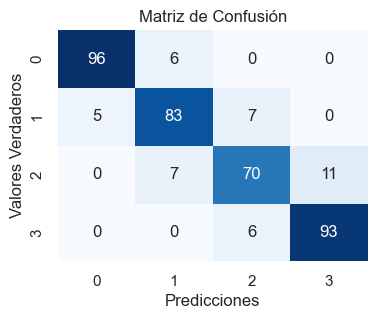

Modelo: GaussianNB
precision: 0.8046875
Recall: 0.8046875
F1-score: 0.8062826826072417
Accuracy: 0.8046875


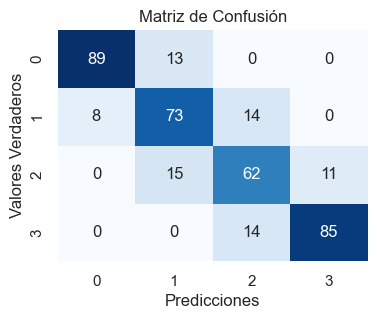

Modelo: MLPClassifier
precision: 0.9661458333333334
Recall: 0.9661458333333334
F1-score: 0.9661166629027402
Accuracy: 0.9661458333333334


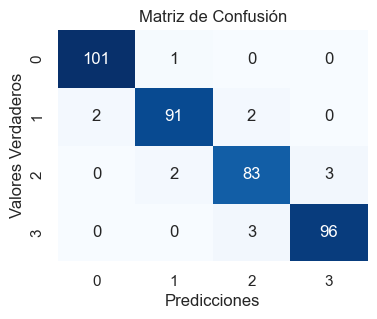

Modelo: LinearSVC
precision: 0.9583333333333334
Recall: 0.9583333333333334
F1-score: 0.9584284820456807
Accuracy: 0.9583333333333334


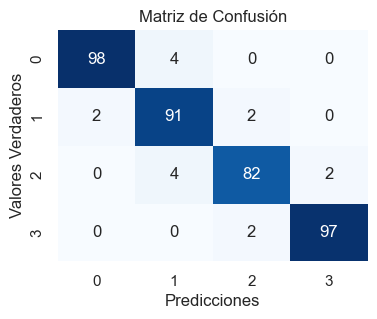

Modelo: svm.NuSVC
precision: 0.9453125
Recall: 0.9453125
F1-score: 0.9453437084071937
Accuracy: 0.9453125


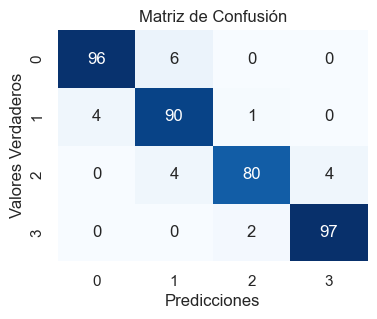

Modelo: NearestCentroid
precision: 0.6328125
Recall: 0.6328125
F1-score: 0.6402038096688426
Accuracy: 0.6328125


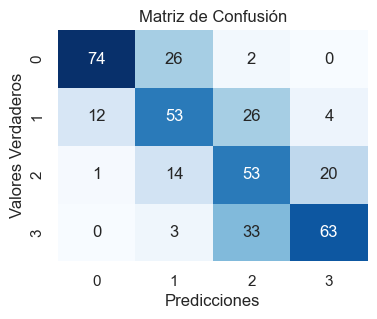

Modelo: xgb.XGBClassifier
precision: 0.90625
Recall: 0.90625
F1-score: 0.9060855546928916
Accuracy: 0.90625


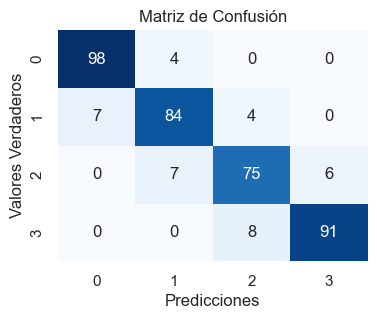

12/12 [==============================] - 0s 909us/step
Modelo: Red neuronal (relu)
precision: 0.9401041666666666
Recall: 0.9401041666666666
F1-score: 0.9401486966875575
Accuracy: 0.9401041666666666


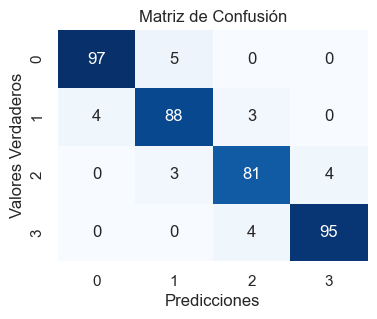

In [163]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
l_accuracy_score,l_precision_score,l_recall_score,l_f1_score=[],[],[],[]

for model_name in list(dict_model.keys()):
    model=dict_model[model_name]
    
    if model_name=="Red neuronal (relu)" or model_name=="Red neuronal (gelu)":
        y_pred_test = np.argmax(model.predict(X_test) , axis=1)

    else:
        y_pred_test = model.predict(X_test)
    print("Modelo:", model_name)
    matriz_confusion = confusion_matrix(Y_test, y_pred_test)
    precision = precision_score(Y_test, y_pred_test, average='micro')
    l_precision_score.append(precision)
    print("precision:", precision)

    recall = recall_score(Y_test, y_pred_test, average='weighted')  # También puedes cambiar 'weighted' a 'micro', 'macro', etc.
    print("Recall:", recall)
    l_recall_score.append(recall)

    # F1-score
    f1 = f1_score(Y_test, y_pred_test, average='weighted')  # También puedes cambiar 'weighted' a 'micro', 'macro', etc.
    print("F1-score:", f1)
    l_f1_score.append(f1)

    # Accuracy
    accuracy = accuracy_score(Y_test, y_pred_test)
    print("Accuracy:", accuracy)
    l_accuracy_score.append(accuracy)

    # Crear un mapa de calor con seaborn
    plt.figure(figsize=(4, 3))
    sns.heatmap(matriz_confusion, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title("Matriz de Confusión")
    plt.xlabel("Predicciones")
    plt.ylabel("Valores Verdaderos")
    plt.show()

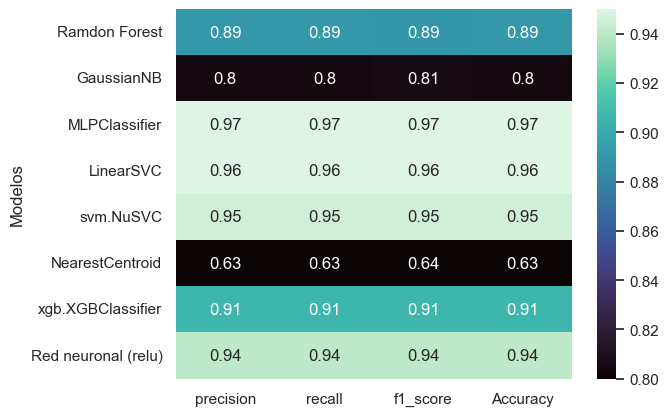

In [164]:
l_nombre_model=list(dict_model.keys())

datos={"Modelos":l_nombre_model,
    "precision":l_precision_score,
    "recall":l_recall_score,
    "f1_score":l_f1_score,
    "Accuracy":l_accuracy_score}
    
df = pd.DataFrame(datos)        
df = df.set_index('Modelos')
if not filtrando_correlacionados:
    df.to_csv('./Resultados/resultado_Modelos.csv', index=True)
else:    
    df.to_csv('./Resultados/resultado_Modelos_Corr.csv', index=True)


sns.heatmap(df, cmap='mako',vmin=0.8,vmax=0.95,annot=True)
plt.show()

No filtrando las columnas no correlacionadas


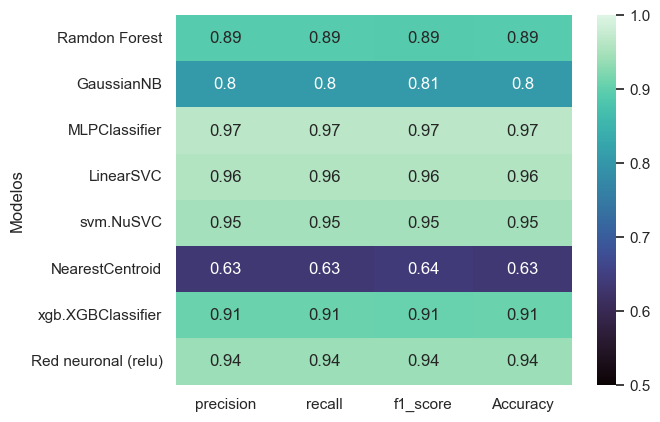

Filtrando las columnas no correlacionadas


<Axes: ylabel='Modelos'>

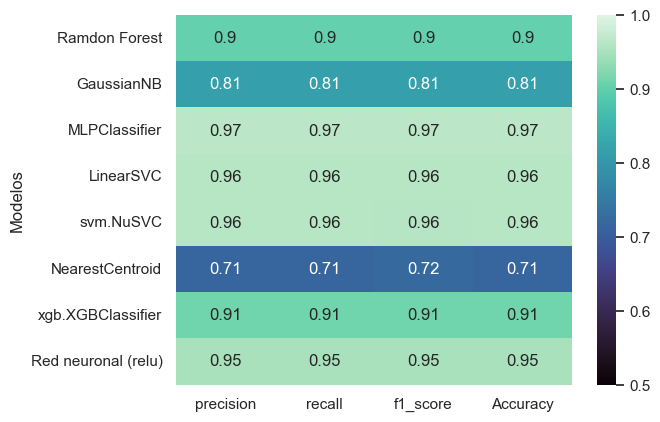

In [165]:
output_name="./Resultados/resultado_Modelos.csv"
data = pd.read_csv(output_name)
data = data.set_index('Modelos')

print("No filtrando las columnas no correlacionadas")
sns.heatmap(data, cmap='mako',vmin=0.5,vmax=1,annot=True)
plt.show()

output_name="./Resultados/resultado_Modelos_Corr.csv"
data_corr = pd.read_csv(output_name)
data_corr = data_corr.set_index('Modelos')

print("Filtrando las columnas no correlacionadas")
sns.heatmap(data_corr, cmap='mako',vmin=0.5,vmax=1,annot=True)

<Axes: ylabel='Modelos'>

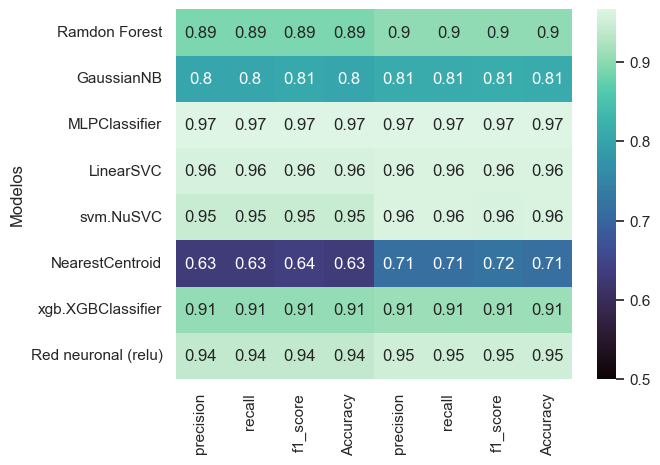

In [166]:
resultado_vertical = pd.concat([data, data_corr], axis=1)
sns.heatmap(resultado_vertical, cmap='mako',vmin=0.5,annot=True)

#### Análisis de resultados:

<span style="color:blue">Sección outliers:</span>    
- En la sección de outliers vimos que la visualización de los boxplot es mucho mejor cuando utilizamos el paramétro "hue=range_price".  
- Con la eliminación de los outliers mejoro levemente los resultados de los métodos de clasificación. 

<span style="color:blue">Sección Correlation Matrix:</span>      
- En la sección Correlation Matrix vimos que sólo once columnas estaban correlacionadas con la columna de la variable dependiente, "range_prices".
- Al eliminar las columnas no correlacionadas con la variable dependiente, "range_prices" notamos gran mejoría en los resultados de los modelos de clasificación. Es decir, los modelos de clasificación mejoraron sus resultados en general y se hicieron más rápidos de ejecutar.

<span style="color:blue">Sección de Resultados:  </span>      
- En esta sección se pueden ver los resultados de todos los modelos, incluyendo los resultados de las columnas filtradas y no filtradas por la matriz de correlaciones. Al ver los resultados mostrados en el mapa de calor se ve que las medidas presición, recall, f1_score y accuracy  tienen valores semejantes para un modelo arbitrario.
- El mejor modelo de todos los utilizados es el "MLPClassifier" cuando utiliza los datos filtrados por la matriz de correlación y quitando los outliers.